# Shopee - Price Match Guarantee

### Determine if two products are the same by their images



Shopee Pte Ltd is a Singaporean multinational technology company which focuses mainly on e-commerce. Headquartered under Sea Group (previously known as Garena), Shopee was first launched in Singapore in 2015, and later expanded its reach to Malaysia, Thailand, Taiwan, Indonesia, Vietnam, the Philippines, Brazil, Mexico and Cambodia.

Do you scan online retailers in search of the best deals? You're joined by the many savvy shoppers who don't like paying extra for the same product depending on where they shop. Retail companies use a variety of methods to assure customers that their products are the cheapest. Among them is product matching, which allows a company to offer products at rates that are competitive to the same product sold by another retailer. To perform these matches automatically requires a thorough machine learning approach, which is where your data science skills could help.

Two different images of similar wares may represent the same product or two completely different items. Retailers want to avoid misrepresentations and other issues that could come from conflating two dissimilar products. Currently, a combination of deep learning and traditional machine learning analyzes image and text information to compare similarity. But major differences in images, titles, and product descriptions prevent these methods from being entirely effective.

(Source - kaggle)

We are challenged to apply our machine learning skills to predict which all products are similiar.

#### Reference

1. https://www.kaggle.com/isaienkov/shopee-data-understanding-and-analysis
2. https://www.kaggle.com/andradaolteanu/i-shopee-text-prep-fe-image-augmentation?scriptVersionId=58133547
3. https://www.kaggle.com/samir95/phash-distance-matrix
4. https://github.com/luchonaveiro/image-search-engine/blob/master/03_Images_Feature_Comparisson.ipynb
5. https://github.com/krishnaik06/Autoviz/blob/main/Autoviz.ipynb

In [208]:
# import all libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm 
import imagehash
import cv2, os
import skimage.io as io
from PIL import Image
import random
import matplotlib.image as mpimg
from nltk.corpus import stopwords
import time
from sklearn.metrics import pairwise_distances
from wordcloud import WordCloud
import plotly.express as px
from sklearn.feature_extraction.text import CountVectorizer
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras import layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model
from pathlib import Path

### Performance Metric

Submissions will be evaluated based on their mean F1 score. The mean is calculated in a sample-wise fashion, meaning that an F1 score is calculated for every predicted row, then averaged.

##### Why F1 score and not Accuracy?
Accuracy is useful when the class distribution is similar, in this case the class distribution (label_group) is highly imbalanced and F1-score is a better metric when there are imbalanced classes.


### Data Overview

In [37]:
train = pd.read_csv('shopee-data/train.csv')
train.head()

,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,Paper Bag Victoria Secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,"Double Tape 3M VHB 12 mm x 4,5 m ORIGINAL / DO...",2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,Maling TTS Canned Pork Luncheon Meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,Daster Batik Lengan pendek - Motif Acak / Camp...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,Nescafe \xc3\x89clair Latte 220ml,3648931069


~ posting_id - the ID code for the posting.

~ image - the image id/md5sum.

~ image_phash - a perceptual hash of the image.

~ title - the product description for the posting.

~ label_group - ID code for all postings that map to the same product. Not provided for the test set.

##### What is phash? 

~ phash is nothing but the perpetual hash also known as the fingerprint of an image.

~ It is basically a unique string which represents the image. We can compare 2 phash’s of 2 images by calculating their hamming distance. The smaller the distance, the more the images are similar. 

~ Fortunately we have been provided with the phash of all the train images in the dataset.


In [16]:
print("Total rows in metadata of training dataset: ",len(train))

Total rows in metadata of training dataset:  34250


In [17]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34250 entries, 0 to 34249
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   posting_id   34250 non-null  object
 1   image        34250 non-null  object
 2   image_phash  34250 non-null  object
 3   title        34250 non-null  object
 4   label_group  34250 non-null  int64 
dtypes: int64(1), object(4)
memory usage: 1.3+ MB


In [18]:
test = pd.read_csv('shopee-data/test.csv')
test.head()

,posting_id,image,image_phash,title
0,test_2255846744,0006c8e5462ae52167402bac1c2e916e.jpg,ecc292392dc7687a,Edufuntoys - CHARACTER PHONE ada lampu dan mus...
1,test_3588702337,0007585c4d0f932859339129f709bfdc.jpg,e9968f60d2699e2c,(Beli 1 Free Spatula) Masker Komedo | Blackhea...
2,test_4015706929,0008377d3662e83ef44e1881af38b879.jpg,ba81c17e3581cabe,READY Lemonilo Mie instant sehat kuah dan goreng


~ posting_id - the ID code for the posting.

~ image - the image id/md5sum.

~ image_phash - a perceptual hash of the image.

~ title - the product description for the posting.

#### We can expect to find roughly 70,000 images in the hidden test set in kaggle. The few test rows and images that are provided are intended to illustrate the hidden test set format and folder structure.

In [19]:
print("Total rows in metadata of testdataset: ",len(test))

Total rows in metadata of testdataset:  3


In [20]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   posting_id   3 non-null      object
 1   image        3 non-null      object
 2   image_phash  3 non-null      object
 3   title        3 non-null      object
dtypes: object(4)
memory usage: 224.0+ bytes


In [21]:
sample_submission = pd.read_csv('shopee-data/sample_submission.csv')
sample_submission.head()

,posting_id,matches
0,test_2255846744,test_2255846744
1,test_3588702337,test_3588702337
2,test_4015706929,test_4015706929


~ We are supposed to submit the file naming "sample_submission.csv" and the contents will be posting_id and the posting_ids which will match the associated posting_id, including itself.

In [22]:
train_images = os.listdir('shopee-data/train_images')

print("Total images in training dataset: ", len(train_images))

Total images in training dataset:  32412


In [23]:
test_images = os.listdir('shopee-data/test_images')

print("Total images in test dataset: ", len(test_images))

Total images in test dataset:  3


In [24]:
train_images[1578]

'0cbe71cfc224e4ace275c044725c4136.jpg'

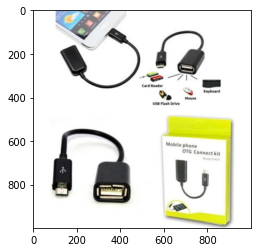

In [25]:
img = mpimg.imread('shopee-data/train_images/0cbe71cfc224e4ace275c044725c4136.jpg')
imgplot = plt.imshow(img)

In [26]:
test_images[2]

'0008377d3662e83ef44e1881af38b879.jpg'

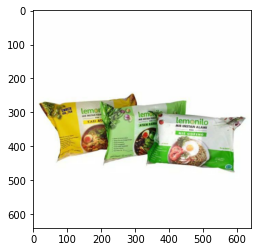

In [27]:
img = mpimg.imread('shopee-data/test_images/0008377d3662e83ef44e1881af38b879.jpg')
imgplot = plt.imshow(img)

### Let's explore each fields of train dataset

In [24]:
train.nunique()

posting_id     34250
image          32412
image_phash    28735
title          33117
label_group    11014
dtype: int64

##### Observation

~ There are 34250 rows and hence 34250 posting ids

~ There are 32412 unique images that means there are 1838 duplicate images

~ There are 28735 unique image_phashes that means there are 5515 duplicates.

~ There are 1133 duplicate titles.

~ 32412 images are grouped into 11014 labels.

#### Let's see some duplicate images

In [27]:
""" Finding out the duplicate images i.e. which all     /
    images have same names using duplicated() function
"""

duplicate_images = train[train.image.duplicated()]
print("Total duplicate images: ",len(duplicate_images))

Total duplicate images:  1838


In [48]:
""" Sampling out 4 duplicate images from the      /
    list of all duplicate images in train.csv
"""

sample_duplicate_images = duplicate_images.sample(4).image.tolist()
sample_duplicate_images

['3b5956b6600e4b09a5a004ec18e3d186.jpg',
 '287f1b1cdc1abdd9fca7a3ec003d9ca9.jpg',
 '62ddaf58eea4c131d15a2f04538c9e3a.jpg',
 '916366c92061feaa9cd3b9874f4baaa0.jpg']

In [192]:
""" This function plots both duplicate and original images in a grid format.

    The code snippet is referred from 
        https://stackoverflow.com/questions/46615554/how-to-display-multiple-images-in-one-figure-correctly/46616645
"""

def plot_images(check_duplicate_images):
    fig = plt.figure(figsize=(40, 20))
    ax = []
    col = 4
    row = 2
    for i in range(col*row):
        img = mpimg.imread('shopee-data/train_images/'+check_duplicate_images[i:i+1].image.item())
        # create subplot and append to ax
        ax.append(fig.add_subplot(row,col,i+1))
        plt.imshow(img)
        plt.title(check_duplicate_images[i:i+1].image.item())
        plt.axis('off')
        
    plt.show()

In [155]:
""" creating an array of images of both duplicate and 
    original images from the sample of duplicate images 
"""

check_duplicate_images = train[train.image.isin(sample_duplicate_images)]

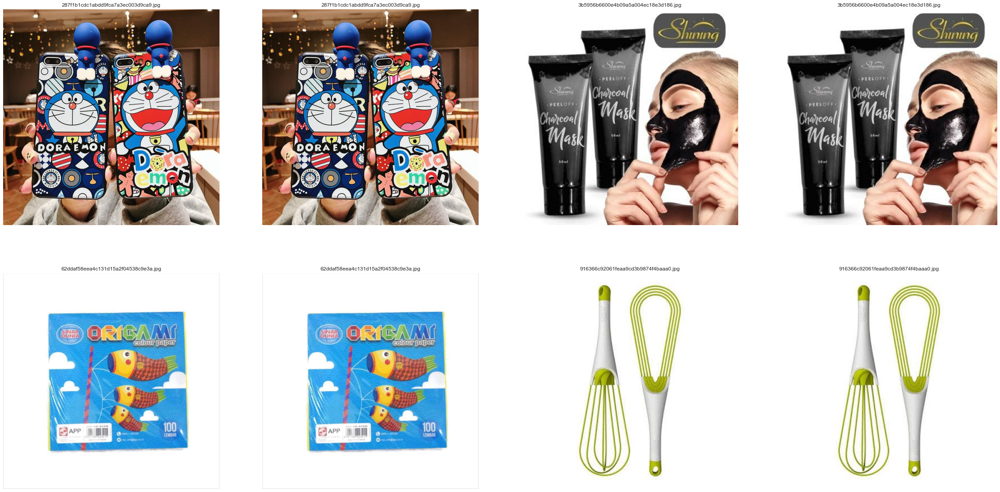

In [193]:
# calling the plotting function

plot_images(check_duplicate_images)

#### Let's see duplicate phashes from "image_phash" feature

In [77]:
""" Finding out the duplicate phashes i.e. which all     /
    phashes have same names using duplicated() function
"""

duplicate_phash = train[train.image_phash.duplicated()]
print("Total duplicate phashes:",len(duplicate_phash))

Total duplicate phashes: 5515


In [142]:
""" Sampling out 4 duplicate phashes from the      /
    list of all duplicate phashes in train.csv
"""

sample_duplicate_phash = duplicate_phash.sample(4).image_phash.tolist()
sample_duplicate_phash

['ee8d95b25c4b026d',
 'd5d5936a0ec1dd0a',
 'e28dc87a8d42b576',
 'e81a85a59ade1e3a']

In [190]:
""" This function plots both duplicate and original images for same phashes in a grid format.

    The code snippet is referred from 
        https://stackoverflow.com/questions/46615554/how-to-display-multiple-images-in-one-figure-correctly/46616645
"""

def plot_images_phash(check_duplicate_phash):
    fig = plt.figure(figsize=(40, 20))
    ax = []
    col = 5
    row = 2
    for i in range(col*row):
        img = mpimg.imread('shopee-data/train_images/'+check_duplicate_phash[i:i+1].image.item())
        # create subplot and append to ax
        ax.append(fig.add_subplot(row,col,i+1))
        plt.imshow(img)
        plt.title(check_duplicate_phash[i:i+1].image_phash.item())
        plt.axis('off')
        
    plt.show()

In [151]:
""" creating an array of images of both duplicate and 
    original images of same phashes from the sample of duplicate images 
"""

check_duplicate_phash = train[train.image_phash.isin(sample_duplicate_phash)]

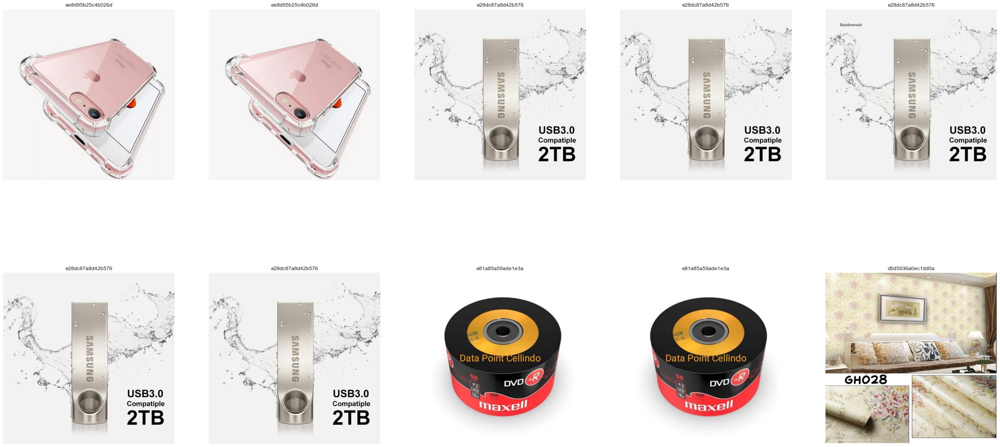

In [191]:
# calling the plotting function

plot_images_phash(check_duplicate_phash)

### Let's check duplicate titles from the dataset i.e. rows which have exactly same title.

In [87]:
""" Finding out the duplicate titles i.e. which all     /
    titles have same names using duplicated() function
"""

duplicate_title = train[train.title.duplicated()]
print("Total duplicate titles: ",len(duplicate_title))

Total duplicate titles:  1133


In [88]:
""" Sampling out 4 duplicate titles from the      /
    list of all duplicate titles in train.csv
"""

sample_duplicate_title = duplicate_title.sample(4).title.tolist()
sample_duplicate_title

['Kanebo Refil Polos Sedang - Grosir - AION Plas Chamois Mobil Motor Kain Lap MICROFIBER',
 'Rich Dad Poor Dad - Robert T. Kiyosaki',
 'KIPAS ANGIN MINI PORTABLE / MINI FAN USB / KIPAS ANGIN USB',
 'TAS CANVAS/TAS IMPORT /TAS TOTE BAG WANITA /TAS MURAH/TAS SELEMPANG/MINI TOTEBAG ALICE']

In [89]:
""" creating an array of images of both duplicate and 
    original images of same title from the sample of duplicate images 
"""

check_duplicate_title = train[train.title.isin(sample_duplicate_title)]

In [188]:
""" This function plots both duplicate and original images for same titles in a grid format.

    The code snippet is referred from 
        https://stackoverflow.com/questions/46615554/how-to-display-multiple-images-in-one-figure-correctly/46616645
"""

def plot_images_title(check_duplicate_title):
    
    fig = plt.figure(figsize=(40, 20))
    ax = []
    col = 5
    row = 2
    for i in range(col*row):
        img = mpimg.imread('shopee-data/train_images/'+check_duplicate_title[i:i+1].image.item())
        # create subplot and append to ax
        ax.append(fig.add_subplot(row,col,i+1))
        plt.imshow(img)
        plt.title(check_duplicate_title[i:i+1].title.item())
        plt.axis('off')
        
    plt.show()    

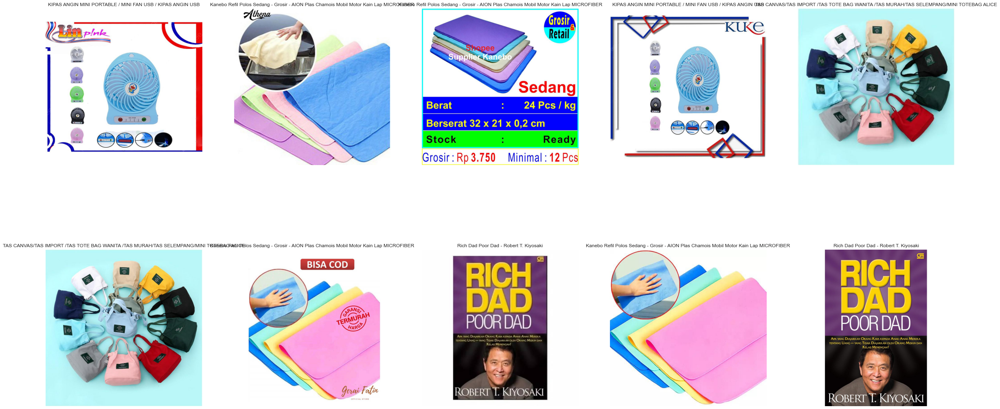

In [189]:
# calling the plotting function

plot_images_title(check_duplicate_title)

### Let's analyze the "label_group" feature since this is our target variable

In [162]:
""" counting number of data points each label_group has
"""

label_count = train.groupby(["label_group"])["label_group"].count()

""" sorting the number of data points in descending order
"""
label_count = label_count.sort_values(ascending=False)

In [163]:
label_count

label_group
159351600     51
3627744656    51
562358068     51
3113678103    51
994676122     51
              ..
1932824351     2
3381497963     2
1934657835     2
3381177724     2
1471548468     2
Name: label_group, Length: 11014, dtype: int64

In [185]:
""" Let's see some images for label_groups which have highest number of images
"""

sample_label_group = train[train['label_group']==3627744656]

In [186]:
images = sample_label_group.image

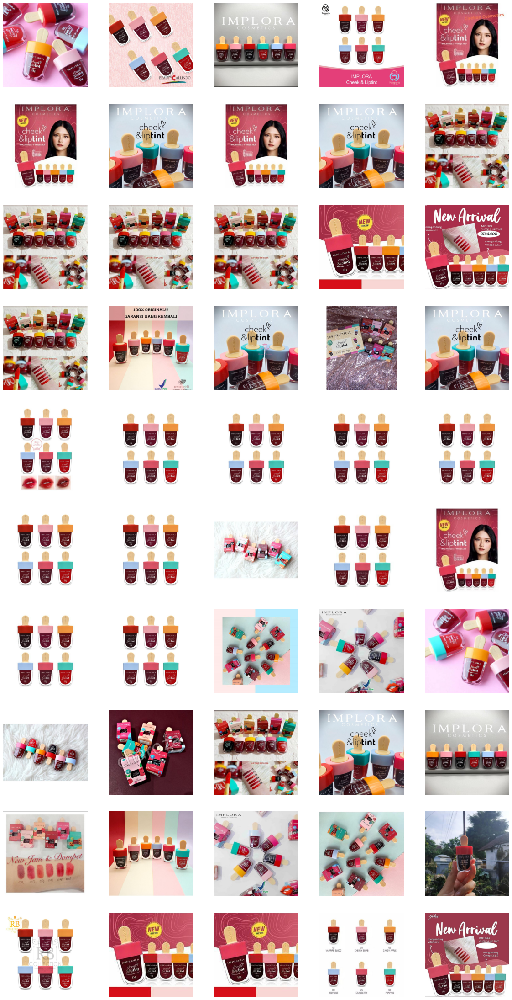

In [187]:
""" Displaying the images which all have same label group - 3627744656

    The code snippet is referred from 
        https://stackoverflow.com/questions/46615554/how-to-display-multiple-images-in-one-figure-correctly/46616645
"""
fig = plt.figure(figsize=(20,40))
ax = []
col = 5
row = 10
for i in range(col*row):
    img = mpimg.imread('shopee-data/train_images/'+images[i:i+1].item())
    # create subplot and append to ax
    ax.append(fig.add_subplot(row,col,i+1))
    plt.imshow(img)
    plt.axis('off')

In [179]:
sample_label_group = train[train['label_group']==3113678103]

In [181]:
images = sample_label_group.image

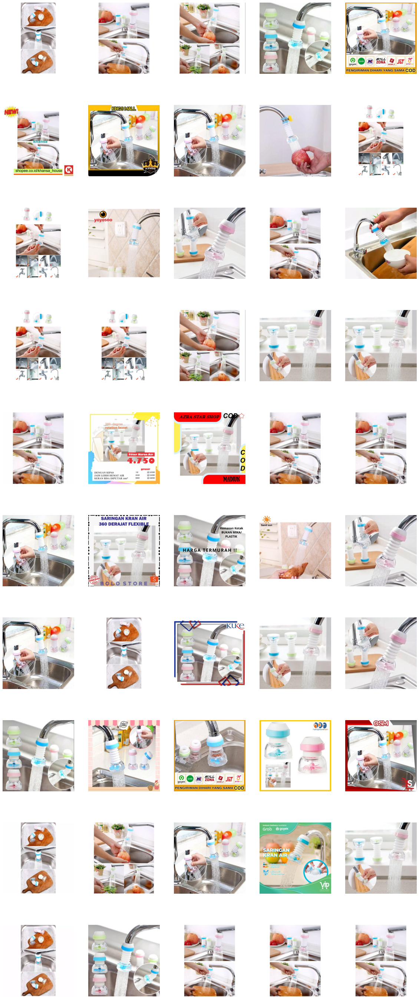

In [184]:
""" Displaying the images which all have same label group - 3113678103

    The code snippet is referred from 
        https://stackoverflow.com/questions/46615554/how-to-display-multiple-images-in-one-figure-correctly/46616645
"""

fig = plt.figure(figsize=(20,50))
ax = []
col = 5
row = 10
for i in range(col*row):
    img = mpimg.imread('shopee-data/train_images/'+images[i:i+1].item())
    # create subplot and append to ax
    ax.append(fig.add_subplot(row,col,i+1))
    plt.imshow(img)
    plt.axis('off')

### Let's preprocess the "title" feature in train dataset

Steps:

1. Download stopwords from nltk library
2. Preprocess the contractions like aren't to are not, you're to you are, etc.
3. Remove alphanumeric characters.
4. Remove stop words
5. Convert all letters to lowercase.


In [32]:
""" Downloading all the stop words from nltk library and displaying it.
"""

stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

list of stop words: {'other', "should've", 'who', 'them', 'because', 'he', "it's", 'down', 'we', 'between', "wasn't", 'how', "she's", 'now', 'here', 'not', 'from', 'those', "weren't", "shouldn't", 'some', 'why', 'themselves', 'more', 'will', "hasn't", 'my', 'as', 'our', 'wasn', 'were', 'y', 'it', 'have', 'or', 'to', 'if', 'few', 'a', 'am', 'can', 'hers', 's', 'her', 'at', 'should', 'for', 'no', 'both', 'they', 'mustn', 'shouldn', "mightn't", 'up', 'in', 'wouldn', "you're", "that'll", 'into', 've', "haven't", 't', 'his', 'each', 'its', 'this', 'after', 'weren', "hadn't", 'these', 'there', 'on', 'doing', 'the', 'be', 'whom', 'shan', 'did', 'very', 'is', 'above', 'during', 'had', 'through', 'such', 'but', 'theirs', 'didn', 'ain', 'mightn', 'll', "doesn't", 'yours', 'just', 'own', 'won', 'do', 'before', 'over', 'further', 're', 'ours', 'against', 'once', 'yourself', 'you', 'most', 'under', "you've", 'don', 'which', 'doesn', 'about', 'are', 'with', 'having', 'haven', 'any', 'myself', 'and',

In [33]:
""" decontracted() function for preprocessing the contractions.

    This code snippet is reffered from GBDT assignment.
"""

import re
def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)
    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [39]:
""" preprocess_text() function to remove single characters, alphanumeric characters,        /
    stop words and converting all the letters into lowercase.
    
    This code snippet is reffered from GBDT assignment.
"""
from tqdm import tqdm
def preprocess_text(text_data):
    preprocessed_text = []
    # tqdm is for printing the status bar
    for sentence in tqdm(text_data):
        sent = decontracted(sentence)
        sent = sent.replace('\\r', ' ')
        sent = sent.replace('\\n', ' ')
        sent = sent.replace('\\"', ' ')
        sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
        # https://gist.github.com/sebleier/554280
        sent = ' '.join(e for e in sent.split() if e.lower() not in stop_words)
        preprocessed_text.append(sent.lower().strip())
    return preprocessed_text

In [40]:
preprocessed_title = preprocess_text(train['title'].values)

100%|██████████| 34250/34250 [00:00<00:00, 58326.74it/s]


In [42]:
train['title'] = preprocessed_title

In [43]:
# displaying the preprocessed text.

train.head()

,posting_id,image,image_phash,title,label_group
0,train_129225211,0000a68812bc7e98c42888dfb1c07da0.jpg,94974f937d4c2433,paper bag victoria secret,249114794
1,train_3386243561,00039780dfc94d01db8676fe789ecd05.jpg,af3f9460c2838f0f,double tape 3m vhb 12 mm x 4 5 original double...,2937985045
2,train_2288590299,000a190fdd715a2a36faed16e2c65df7.jpg,b94cb00ed3e50f78,maling tts canned pork luncheon meat 397 gr,2395904891
3,train_2406599165,00117e4fc239b1b641ff08340b429633.jpg,8514fc58eafea283,daster batik lengan pendek motif acak campur l...,4093212188
4,train_3369186413,00136d1cf4edede0203f32f05f660588.jpg,a6f319f924ad708c,nescafe xc3 x89clair latte 220ml,3648931069


In [58]:
""" Checking how many times a word occurs in the "title" feature

    Ref - https://www.w3resource.com/python-exercises/string/python-data-type-string-exercise-12.php
"""

def word_count(str):
    counts = dict()
    words = str.split()

    for word in words:
        if word in counts:
            counts[word] += 1
        else:
            counts[word] = 1

    return counts

In [154]:
""" concatenating all the titles
"""
combo = ' '
for i in (train['title'].values):
    combo = combo + i

""" updating the word and word count into a dictionary  
"""  
count = word_count(combo)    

""" Removing the numerical keys from the dictionary
"""
x = count.keys()
for i in tuple(x):
    if i.isdigit():
        del count[i]

In [155]:
""" For visualizing purpose
"""

""" converting the "count" dictionary into dataframe 
"""
wordcount = pd.DataFrame([])
wordcount['words'] = count.keys()
wordcount['word_count'] =  count.values()

""" sorting the dataframe in descending order of their counts
"""
wordcount=wordcount.sort_values(by=["word_count"],ascending=False)
wordcount = wordcount.reset_index(drop=True)
        
wordcount.head(10)

,words,word_count
0,anak,1830
1,wanita,1502
2,original,1223
3,dan,1159
4,pria,1104
5,untuk,1067
6,anti,1036
7,tas,988
8,bayi,941
9,murah,893


~ As we can see "anak" has the highest count in the whole dataset.

~ Followed by wanita, original dan pria.

C:\Users\praty\Anaconda3\envs\tensorflow\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



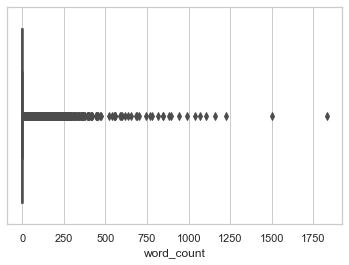

In [156]:
""" Boxplot
"""
sns.set(style="whitegrid")
ax=sns.boxplot(wordcount["word_count"])

<AxesSubplot:>

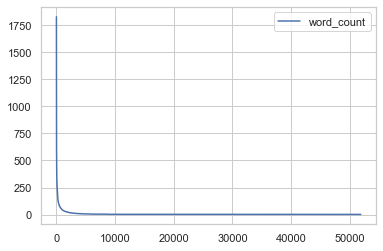

In [243]:
""" Simple histogram
"""
wordcount.plot()

From above plottings we can say that

~ Approximately 0.00012% (6 words) of words only have count more than 1000

~ More than 95% or words have count less than 250

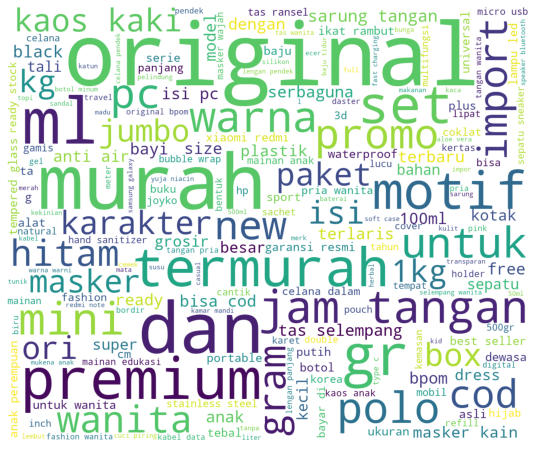

In [93]:
""" WordCloud
    
    (Wikipedia)
    Word clouds (also known as text clouds or tag clouds) work in a simple way: 
    the more a specific word appears in a source of textual data (such as a speech, blog post, or database), 
    the bigger and bolder it appears in the word cloud.
    
    Ref - https://www.kaggle.com/andradaolteanu/i-shopee-text-prep-fe-image-augmentation?scriptVersionId=58133547
"""

text = " ".join(title for title in train["title"])
wordcloud = WordCloud(stopwords=stop_words,
                      max_font_size=200, random_state=42,
                      width=1200, height=1000,background_color="white")
wordcloud.generate(text)
plt.figure(figsize = (16, 8))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

### A simple model by considering only the "title" feature by using pairwise_distances.

This will predict the datapoints which are similar to the title by calculating their pairwise distances.

In [162]:
""" Coverting the title feature into a sparse matrix where the shape of the matrix is 
    (number of datapoints) X (total number of words in the title feature) using CountVectorizer()
"""

vectorizer = CountVectorizer()
features   = vectorizer.fit_transform(train['title'])
features.get_shape() 

(34250, 24932)

In [163]:
features[5]

<1x24932 sparse matrix of type '<class 'numpy.int64'>'
	with 9 stored elements in Compressed Sparse Row format>

~ This means out of 24932 dimensions only 9 dimensions are filled becasue it consists of only 9 words out of 24932

In [164]:
""" fitting the test dataset's title to the CountVectorizer trained.
"""

test_features   = vectorizer.transform(test['title'])
test_features.get_shape() 

(3, 24932)

In [141]:
""" storing posting_id and the corresponding 1D sparse matrice into a dictionary for train and test dataset.
"""

dictionary = dict(zip(train['posting_id'], title_features))

In [142]:
dictionary['train_4028265689']

<1x24932 sparse matrix of type '<class 'numpy.int64'>'
	with 12 stored elements in Compressed Sparse Row format>

In [143]:
test_dict = dict(zip(test['posting_id'], test_title_features))

In [167]:
""" plotting images

    Ref - https://stackoverflow.com/questions/46615554/how-to-display-multiple-images-in-one-figure-correctly/46616645
"""
def plot_images(check_duplicate_title,titles):
    
    fig = plt.figure(figsize=(20, 20))
    ax = []
    col = 5
    row = 4
    for i in range(col*row):
        img = mpimg.imread('shopee-data/train_images/'+check_duplicate_title[i:i+1].item())
        # create subplot and append to ax
        ax.append(fig.add_subplot(row,col,i+1))
        plt.imshow(img)
        plt.title(titles[i:i+1].item())
        plt.axis('off')
        
    plt.show() 

In [152]:
""" The pairwise_distances function calculates the distance between the 2 titles or 2 strings and return a numeric value.

    The code snippet is taken from Amazon fine food reviews case study-    
    https://colab.research.google.com/drive/0BwNkduBnePt2VDVCTFpMa21fSHc#scrollTo=RW8Y5ILVN5S1
"""

def pairwise_distance_model(doc_id, num_results):
        
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    pairwise_dist = pairwise_distances(title_features,test_dict[doc_id])
    
    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(train.index[indices])
    images = train['image'].loc[df_indices]
    titles = train['title'].loc[df_indices]    
    
    plot_images(images, titles)

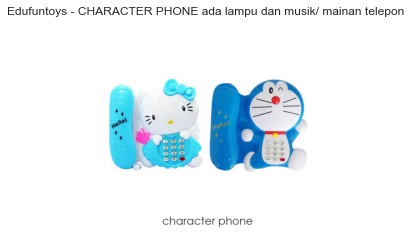

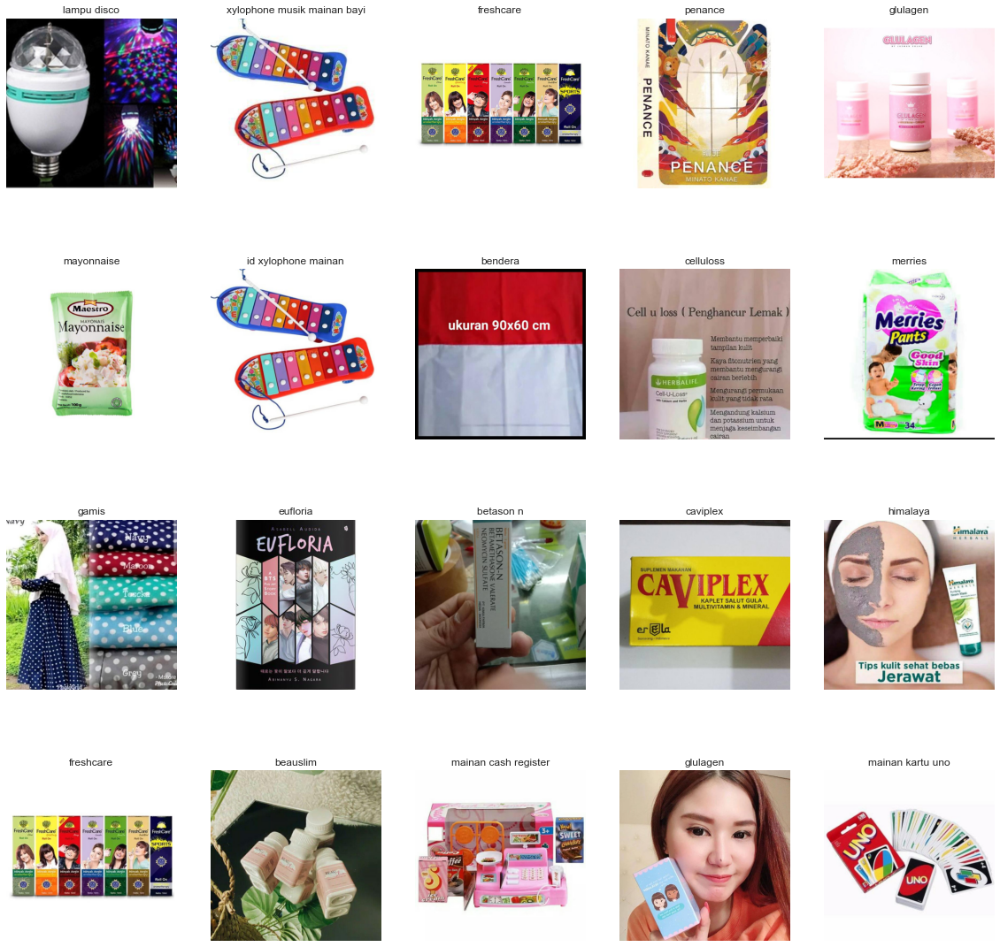

In [168]:
""" Taking a datapoint from a test set and comparing the title with all the titles in the train dataset using 
    pairwise_distances and came up with 20 datapoints with similar titles and displaying the corresponding images.
"""

image = test[test['posting_id']=='test_2255846744']
image1 = image.image.item()
img = mpimg.imread('shopee-data/test_images/'+image1)
plt.imshow(img)  
plt.title(image.title.item())
plt.axis('off')

pairwise_distance_model('test_2255846744', 20)

Obervations:

1. We can see the first image's title, it matched because of the word "lampu" in both the titles.
2. for 2nd image because of the word "musik"
3. Although the images and almost completely different.

### Data Augmentation

~ a technique to increase the diversity of your training set by applying random (but realistic) transformations such as image rotation.

In [172]:
""" Resizing and rescaling the images since images in the dataset are of different shapes
    
    This code snippet is taken from
    Ref - https://www.tensorflow.org/tutorials/images/data_augmentation#data_augmentation_3
"""

IMG_SIZE = 180

resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMG_SIZE, IMG_SIZE),
  layers.experimental.preprocessing.Rescaling(1./255)
])

(-0.5, 179.5, 179.5, -0.5)

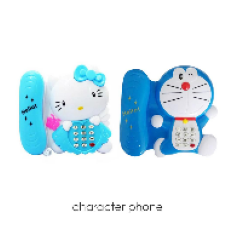

In [182]:
""" tring out 1 image from test dataset
"""

image = test[test['posting_id']=='test_2255846744']
image1 = image.image.item()
img = mpimg.imread('shopee-data/test_images/'+image1)

result = resize_and_rescale(img)
plt.imshow(result)
plt.axis("off")

In [186]:
img.shape

(1000, 1000, 3)

In [185]:
""" this operation inserts a dimension of length 1 at the dimension index.

    Purpose is to follow the pipeline in keras sequential layers.
"""
image = tf.expand_dims(img, 0)
image.shape

TensorShape([1, 1000, 1000, 3])

In [178]:
""" This code snippet tells what we are doing with image, here we are flipping the image harizontally and vertically with 
    a value of rotaion. 
"""

data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
  layers.experimental.preprocessing.RandomRotation(0.2),
])

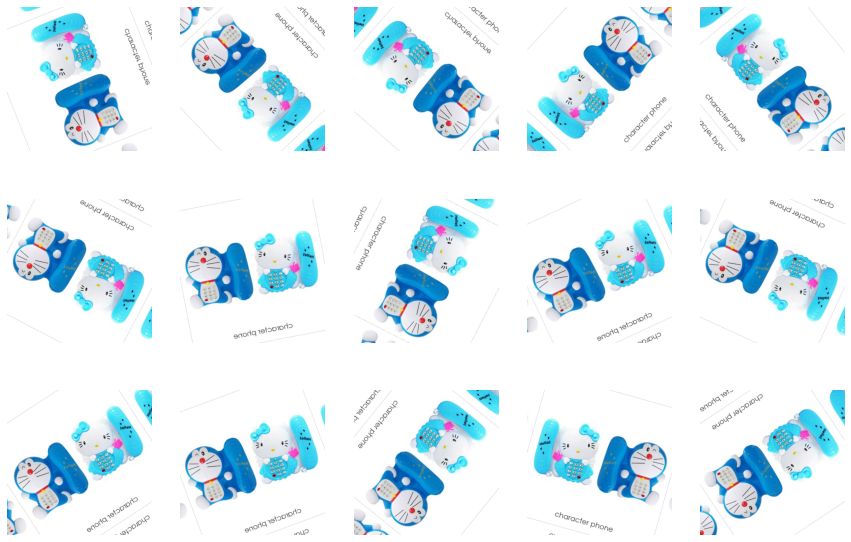

In [179]:
""" displaying the results from the data augmentation on the image.
"""
plt.figure(figsize=(15, 10))
for i in range(15):
    augmented_image = data_augmentation(image)
    ax = plt.subplot(3, 5, i + 1)
    plt.imshow(augmented_image[0])
    plt.axis("off")

## A model to predict similar images using transfer learning (VGG16 trained on imagenets dataset)

#### The below code has been reffered from https://github.com/luchonaveiro/image-search-engine/blob/master/03_Images_Feature_Comparisson.ipynb 


Steps:

1. Resize the image with (224,224,) dimensions
2. Pass the image to VGG16 model with weights trained on imagenets dataset.
3. Get the output from fc1 layer (3rd last dense layer)
4. Output will be a 1D tensor of (1,4096) dimension for a single image which consists of numerical values.
5. Now that we got all 1D tensors for all the images we can compare 2 tensors and calculate their distances.
6. The lesser the value it is the more similar.


In [203]:
""" This function is used for passing the images to the vgg16 modeland get a (1,4096) 1D array of tensors for each image.

    Ref - https://github.com/luchonaveiro/image-search-engine/blob/master/03_Images_Feature_Comparisson.ipynb
"""

class FeatureExtractor:
    
    def __init__(self):
        # Use VGG-16 as the architecture and ImageNet for the weight
        base = VGG16(weights='imagenet')
        # Customize the model to return features from fully-connected layer
        self.model = Model(inputs=base.input, outputs=base.get_layer('fc1').output)
        
    def extract(self, img):
        # Resize the image
        img = img.resize((224, 224))
        # Convert the image color space
        img = img.convert('RGB')
        # Reformat the image
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0) #  this operation inserts a dimension of length 1 at the dimension index.
        
        x = preprocess_input(x) # The images are converted from RGB to BGR, then each color channel 
        #                         is zero-centered with respect to the ImageNet dataset, without scaling.
        
        # Extract Features
        feature = self.model.predict(x)[0]
        return feature / np.linalg.norm(feature)

fe = FeatureExtractor()

In [71]:
""" Below code serves the purpose of saving the 1D array into a file along with the corresponding image data
    
    Ref - https://github.com/luchonaveiro/image-search-engine/blob/master/03_Images_Feature_Comparisson.ipynb
"""


# Iterate through images (Change the path based on your image location)

for i in tqdm(os.listdir("shopee-data/train_images/")):
    # Extract Features
    
    feature = fe.extract(img=Image.open('shopee-data/train_images/'+str(i)))
    # Save the Numpy array (.npy) on designated path
    feature_path = "shopee-data/features/{}.npy".format(str(img_path).replace('.jpg',''))
    np.save(feature_path, feature)
    

C:\Users\praty\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


  0%|          | 0/32412 [00:00<?, ?it/s]

Runtime: 1 hour 30 mins(approx)

In [72]:
""" Below code is for loading the features from the folder and storing it into csv file.

    Ref - https://github.com/luchonaveiro/image-search-engine/blob/master/03_Images_Feature_Comparisson.ipynb
"""

features = []
for f in tqdm(os.listdir("shopee-data/features")):
    
    add_feature = np.load("shopee-data/features/" + str(f))
    add_feature = pd.DataFrame([add_feature])
    add_feature['image'] = f.replace('.npy','.jpg')

    features.append(add_feature)

features = pd.concat(features, axis=0)
features.to_csv('shopee-data/feature_extraction.csv', index=False)

C:\Users\praty\Anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/32412 [00:00<?, ?it/s]

Runtime: 1 hour 30 mins(approx)

In [196]:
""" Reading the csv file of features
"""

features=pd.read_csv("shopee-data/feature_extraction.csv")

In [229]:
""" reading a test image and extracting the features of that image and comparing the 1D array with         /
    all the train images.
    
    Ref - https://github.com/luchonaveiro/image-search-engine/blob/master/03_Images_Feature_Comparisson.ipynb
"""

# Insert the image query
img = Image.open("shopee-data/test_images/0007585c4d0f932859339129f709bfdc.jpg")
# Extract its features
query = fe.extract(img)
# Calculate the similarity (distance) between images
features_data = features.copy()
features_data = features_data.drop(columns = ['image'])
features_data = features_data.values
dists = np.linalg.norm(features_data - query, axis=1)

In [210]:
len(dists)

32412

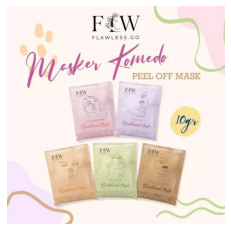

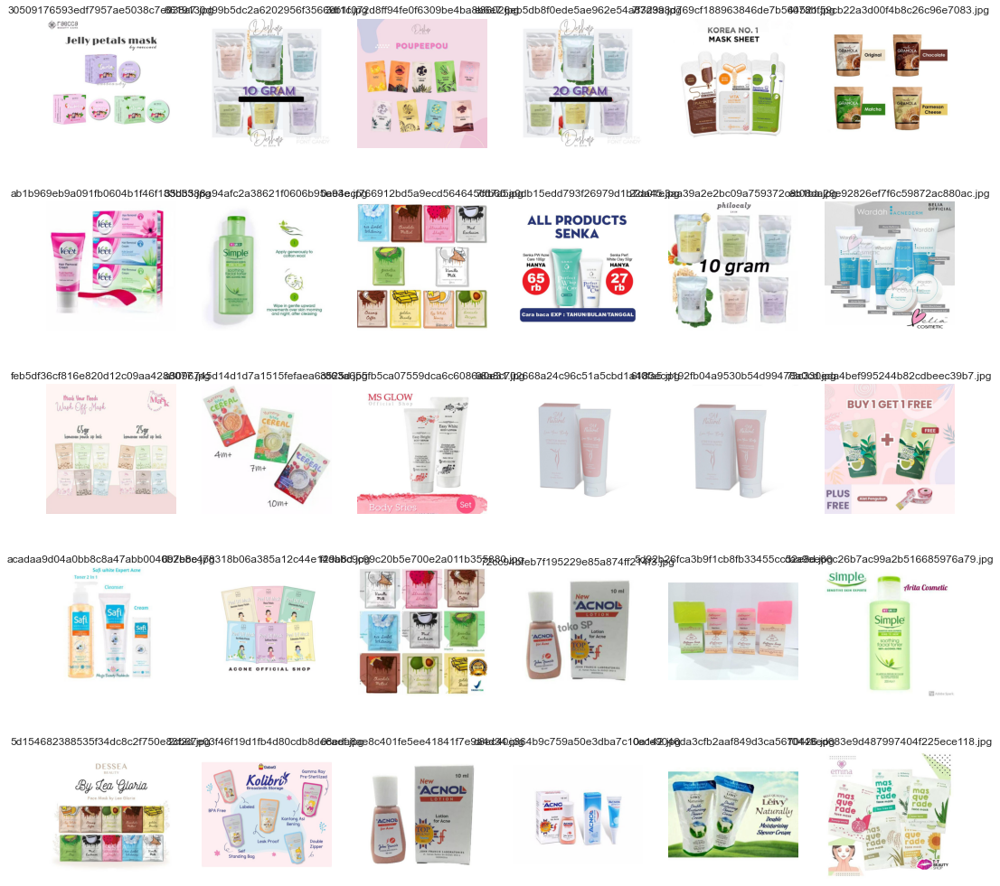

In [241]:
""" Sorting the distances in ascending order and displaying the nearest 30 images

    Ref - https://github.com/luchonaveiro/image-search-engine/blob/master/03_Images_Feature_Comparisson.ipynb
"""

# Extract 30 images that have lowest distance
ids = np.argsort(dists)[:30]
alike = features.iloc[ids,:]['image']
distance = pd.DataFrame({'image': alike, 'score': dists[ids]})
distance = distance.reset_index(drop=True)

plt.imshow(img)
plt.axis('off')


# Visualize the result

ax=[]
fig=plt.figure(figsize=(18,18))
for i in range(5*6):
    ax.append(fig.add_subplot(5, 6,i+1))  
    plt.axis('off')
    plt.imshow(Image.open('shopee-data/train_images/' + distance['image'][i]))
    plt.title(distance['image'][i])
    
plt.show()

#### Obsevation

1.  The results were significantly better than the pairwise_distances model.
2. If we look at the first 4 images the images are approximately similar the number of item in that image, backgroud colour, the items are also same (masks).
3. If we look into other images we can see the company of the product are also matching ("veet")
 

### I tried out a inbuilt python library AutoViz

Automatically Visualize any dataset, any size with a single line of code

https://pypi.org/project/autoviz/0.0.6/

In [21]:
""" Ref - https://github.com/krishnaik06/Autoviz/blob/main/Autoviz.ipynb
"""

from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()

Imported AutoViz_Class version: 0.0.81. Call using:
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 saves plots in your local machine under AutoViz_Plots directory and does not display charts.


Shape of your Data Set: (34250, 5)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  1
    Number of String-Categorical Columns =  2
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  1
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    5 Predictors classified...
        This does not include the Target column(s)
        2 variables removed since they were ID or low-information variables


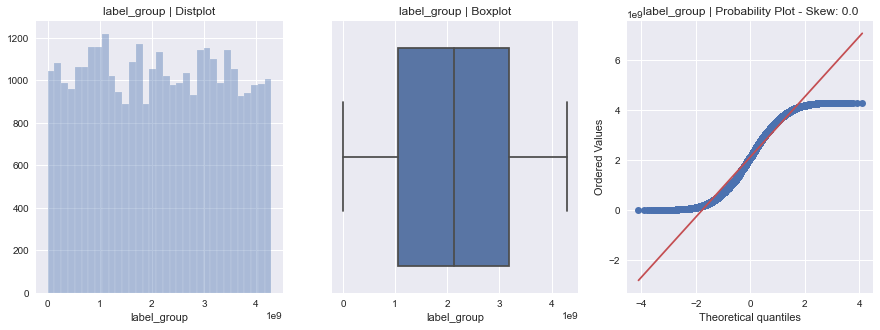

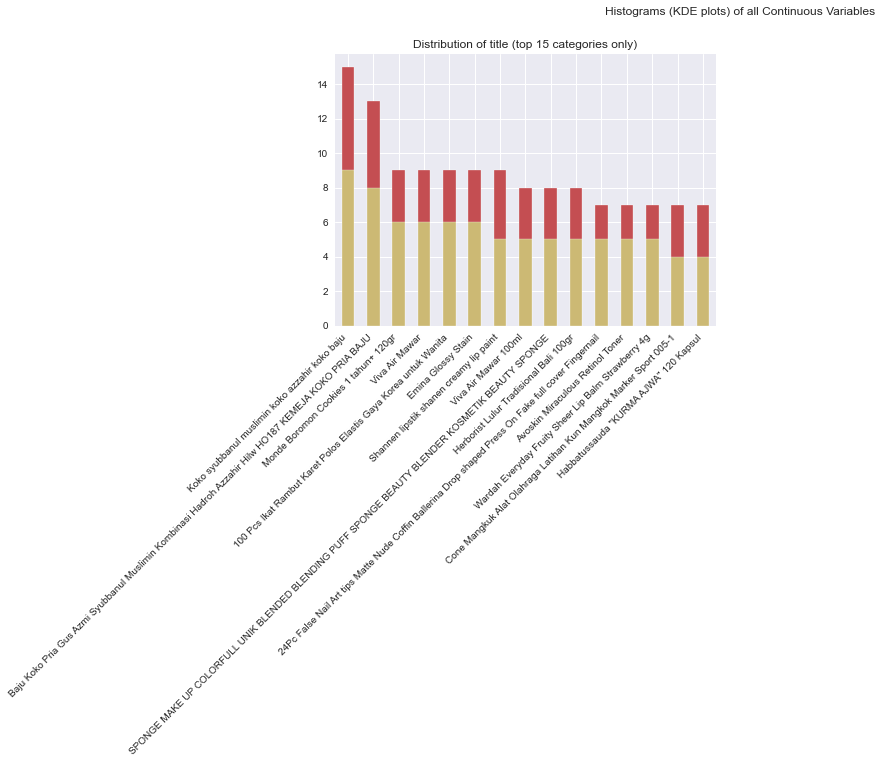

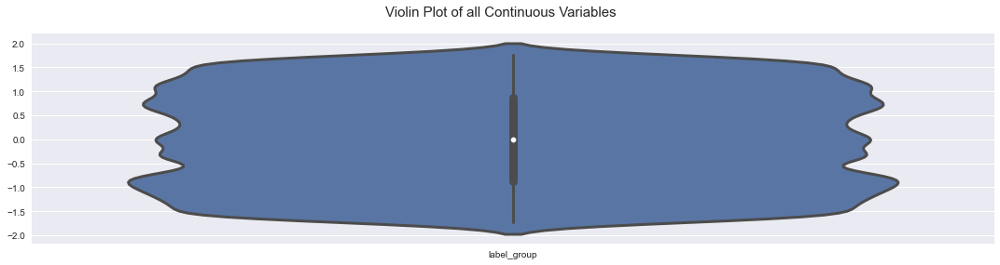

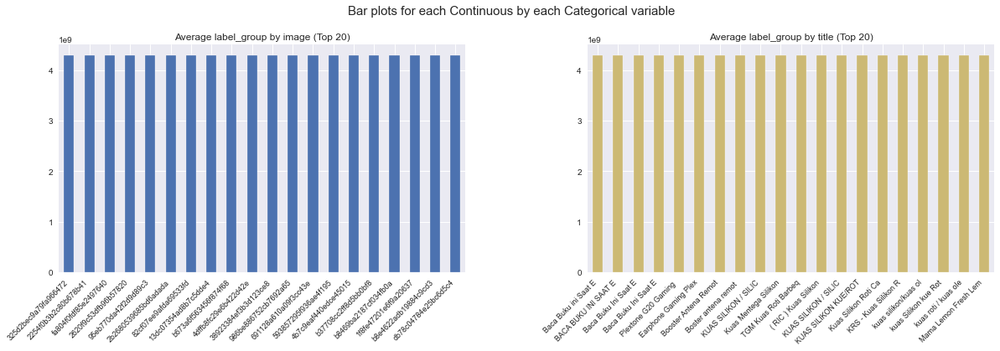

Time to run AutoViz (in seconds) = 2.152

 ###################### VISUALIZATION Completed ########################


In [26]:
filename ='shopee-data/train.csv'
sep = ","
dft = AV.AutoViz(
    filename,
    sep=",",
    depVar="",
    dfte=None,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
)

#### Observation:

1. Here we can see a lot of plots from the dataset.
2. The "image_phash" and "posting_id" column has been removed automatically.
3. We can find the plots are related to "label_group", "title" and "image"
5. 4th plot shows how many datapoints are there for same title.
6. The last 2 plots tells how many images and titles are present with same label group
